About Dataset
Description:

Welcome to the Cars Object Detection Dataset, a comprehensive and meticulously annotated collection designed to empower researchers and practitioners in the field of computer vision and object detection. This dataset showcases a diverse range of vehicles, comprising five distinct classes: 'Ambulance', 'Bus', 'Car', 'Motorcycle', and 'Truck'.

Dataset Overview:

Our meticulously curated dataset contains a wealth of high-resolution images featuring vehicles captured in a variety of real-world scenarios. Each image has been expertly annotated to facilitate accurate object detection, enabling you to explore and advance cutting-edge object detection algorithms.

Key Features:

Diverse Vehicle Classes: With a comprehensive set of five vehicle classes, our dataset enables you to tackle a wide range of real-world challenges in object detection, from the smaller and more agile 'Motorcycle' to the larger and more complex 'Truck'.

High-Quality Annotations: Each image is accompanied by precise bounding box annotations for all instances of the target classes, meticulously handcrafted to ensure accuracy and reliability. This facilitates robust model training and evaluation.

Real-World Scenarios: The dataset captures vehicles in various environmental conditions, lighting situations, and viewpoints, reflecting the complexities of object detection tasks in real-world applications.

Large-Scale Collection: Our dataset encompasses a substantial number of images, providing ample training and testing samples to foster robust model development and comprehensive evaluation.

Potential Applications:

The Cars Object Detection Dataset offers a plethora of potential applications, including but not limited to:

Object Detection Research: Fuel your research endeavors by leveraging our dataset to design, develop, and benchmark state-of-the-art object detection algorithms tailored to automotive scenarios.

Autonomous Vehicles: Train and validate object detection models that contribute to the advancement of autonomous driving systems, enhancing their ability to perceive and interact with diverse vehicles on the road.

Traffic Monitoring and Management: Harness the power of our dataset to create solutions for traffic monitoring, congestion analysis, and vehicle counting in urban environments.

Safety and Emergency Services: Develop object detection models that aid emergency response teams in recognizing and responding to different vehicle types, such as 'Ambulance' and 'Bus', to enhance road safety.

Conclusion:

Embark on a journey of innovation and discovery with our Cars Object Detection Dataset. Whether you're a seasoned researcher, an aspiring data scientist, or a visionary engineer, this dataset serves as a powerful resource to drive progress in object detection technology within the realm of automotive environments. Explore, experiment, and excel with the wealth of information at your fingertips.

In [1]:

!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [2]:
!kaggle datasets download -d abdallahwagih/cars-detection

 86% 33.0M/38.2M [00:00<00:00, 72.9MB/s]
100% 38.2M/38.2M [00:00<00:00, 75.1MB/s]


In [4]:
# this will extract the all folder in colab
import zipfile
zip_ref = zipfile.ZipFile('/content/cars-detection.zip', 'r')
zip_ref.extractall('/content')
zip_ref.close()

In [5]:
# this command will clone the YOLOv5 github Repository
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16013, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (33/33), done.
remote: Total 16013 (delta 25), reused 23 (delta 13), pack-reused 15967
Receiving objects: 100% (16013/16013), 14.60 MiB | 18.92 MiB/s, done.
Resolving deltas: 100% (10991/10991), done.
/content/yolov5


In [6]:
# install all dependencies as necessary
!pip install -r requirements.txt
import torch
from IPython.display import Image,clear_output #to display images

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.5/644.5 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.7 MB/s eta 0:00:00


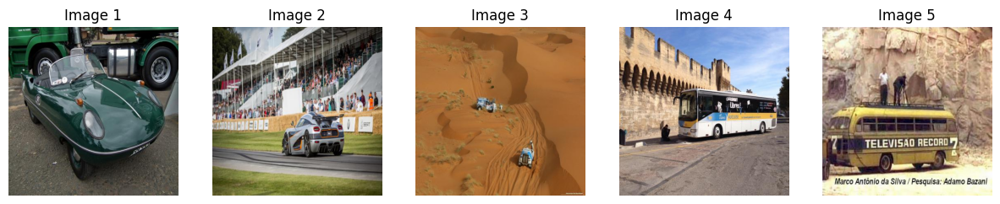

In [13]:
import os
import random
import matplotlib.pyplot as plt
from matplotlib.image import imread

# Directory where your training images are located
data_dir = '/content/Cars Detection/test/images'

# List all files in the directory
image_files = os.listdir(data_dir)

# Select 5 random images
random_images = random.sample(image_files, 5)

# Set up a 2x3 grid for displaying the images
fig, axes = plt.subplots(1, 5, figsize=(15, 5))

# Loop through and display the selected images
for i, image_file in enumerate(random_images):
    image_path = os.path.join(data_dir, image_file)
    image = imread(image_path)
    axes[i].imshow(image)
    axes[i].set_title(f'Image {i+1}')
    axes[i].axis('off')

plt.show()

In [23]:
# this comand will read data  from YAMAL file
%cat /content/data.yaml

path: ../Cars Detection
train: train/images
val: valid/images

nc: 5
names: ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']

In [22]:
# Define Model Configuration and Architure
# difine the number of layers
import yaml
with open("/content/data.yaml", "r") as stream:
  num_classes = str(yaml.safe_load(stream)["nc"])

In [24]:
num_classes

'5'

In [25]:
# this is the model configuration we use
%cat /content/yolov5/models/yolov5l.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],

In [32]:
#customize ipython writfile so we can write variable
from IPython.core.magic import register_line_cell_magic
# use register_line_cell_magic decorator with function
@register_line_cell_magic
def write_template(line,cell):
  with open(line,"w") as f:
    f.write(cell.format(**globals()))

In [33]:
%%write_template /content/yolov5/models/custom_yolov5l.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 1.0  # model depth multiple
width_multiple: 1.0  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [37]:
# NOW Start The traning on custom data using YOLOv5 Dectector for 600 epochs
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 64 --epochs 100 --data "/content/data.yaml" --cfg /content/yolov5/models/custom_yolov5l.yaml --weights "yolov5l.pt" --name yolov5l_results --cache

/content/yolov5
2023-10-24 12:25:55.101150: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-10-24 12:25:55.101207: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-10-24 12:25:55.101244: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5l.pt, cfg=/content/yolov5/models/custom_yolov5l.yaml, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=64, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, si

In [38]:
# viusualise all metrices using tensor board
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

GROUND TRUTH TRANING DATA


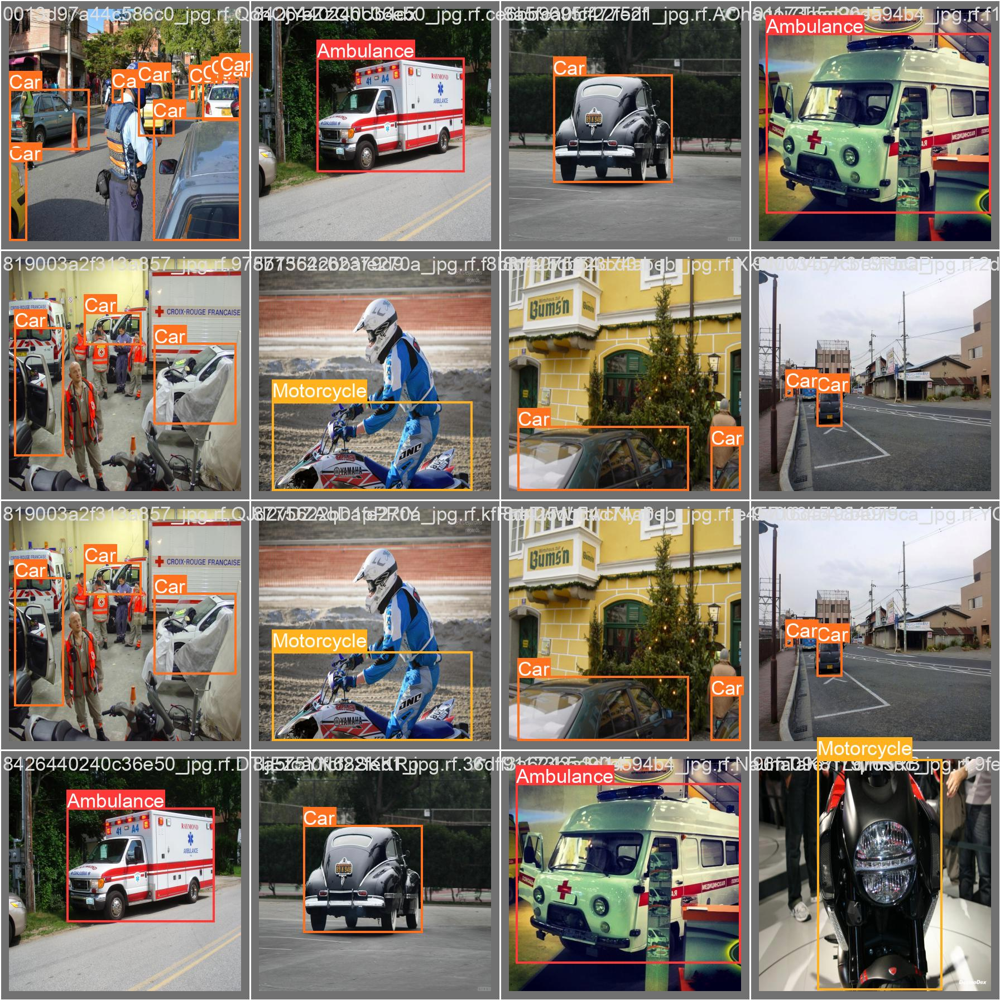

In [39]:
print("GROUND TRUTH TRANING DATA")
Image(filename="/content/yolov5/runs/train/yolov5l_results3/val_batch0_labels.jpg")

In [52]:
# do prediction on test data now
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5l_results3/weights/best.pt --img 416 --conf 0.5 --source /content/Cars\ Detection/test/images

/content/yolov5
detect: weights=['/content/yolov5/runs/train/yolov5l_results3/weights/best.pt'], source=/content/Cars Detection/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-228-g4d687c8 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5l summary: 267 layers, 46129818 parameters, 0 gradients, 107.7 GFLOPs
image 1/126 /content/Cars Detection/test/images/00dea1edf14f09ab_jpg.rf.3f17c8790a68659d03b1939a59ccda80.jpg: 416x416 1 Ambulance, 28.2ms
image 2/126 /content/Cars Detection/test/images/00dea1edf14f09ab_jpg.rf.KJ730oDTFPdXdJxvSLnX.jpg: 416x416 1 Ambulance, 28